# Animated Gif function

In [1]:
# Standard Library imports
import io
from pathlib import Path

# Third party imports
from IPython.display import Image as display_image
from PIL import Image

def animated_gif(data, max_height=None, max_frames=None):
    # Standardize data input variations as list of Path objects
    # of individual images
    if isinstance(data, str) or isinstance(data, Path):
        path = Path(data)
        if path.is_dir():
            files = sorted(path.glob('*.png')) + sorted(path.glob('*.jpg'))
        else:
            raise Exception('Invalid input 1')
    elif isinstance(data, list) or isinstance(data, tuple):
        if all(isinstance(item, str) for item in data):
            files = [Path(item) for item in data]
        elif all(isinstance(item, Path) for item in data):
            files = data
        else:
            raise Exception('Invalid input 2')
    else:
        raise Exception('Invalid input 3')
    # Clip number of frames:
    if max_frames:
        if max_frames < len(files):
            files = files[0:max_frames]    
    # Load Images
    images = [Image.open(file) for file in files]
    # Resize Images
    if max_height:
        width, height = images[0].width, images[0].height
        if max_height < height:
            _ = [img.thumbnail((width, max_height)) for img in images]
    # Create gif in memory
    gif_file = io.BytesIO()
    images[0].save(gif_file,
                   format='gif',
                   save_all=True,
                   append_images=images[1:],
                   loop=0)
    animation = gif_file.getvalue()
    return display_image(animation)

# Google Drive Setup

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Run this only the first time, to download the FGVC tool and models to your google drive

In [3]:
# %%bash
# cd drive/MyDrive
# git clone https://github.com/vt-vl-lab/FGVC
# cd FGVC
# wget –quiet https://filebox.ece.vt.edu/~chengao/FGVC/demo.zip
# unzip demo.zip
# rm demo.zip
# wget –quiet https://filebox.ece.vt.edu/~chengao/FGVC/weight.zip
# unzip weight.zip
# rm weight.zip

# Inpaiting

## Set current working directory to the FGVC tool

In [4]:
import os
print(os.getcwd())
os.chdir('/content/drive/MyDrive/FGVC/tool')
print(os.getcwd())

/content
/content/drive/MyDrive/FGVC/tool


## Imports

In [5]:
# Project import
from video_completion import video_completion_seamless

# Thirdy part imports
import numpy as np

## Frames to be inpainted (+ masks)

In [6]:
# If want to use different data, upload them to your google drive
# and the the folder paths
frames_folder = '/content/drive/MyDrive/FGVC/demo/tennis'
masks_folder = '/content/drive/MyDrive/FGVC/demo/tennis_mask'
results_folder = '/content/drive/MyDrive/FGVC/result/tennis_removal'

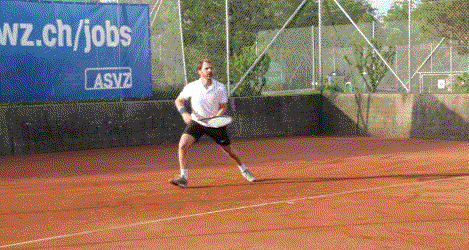

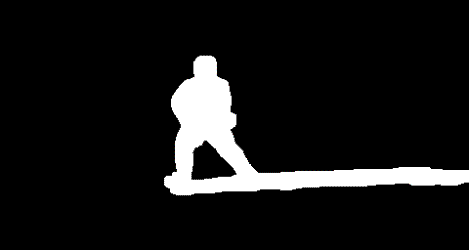

In [7]:
display(animated_gif(frames_folder, max_height=250, max_frames=500))
display(animated_gif(masks_folder, max_height=250, max_frames=500))

## Args for video_completion

In [8]:
class AttributeDict(dict):
    '''
    Dict which keys can be accessed like a normal dict:
    
        my_dict['key']

    or like a class:

        my_dict.key
    
    Useful to mimic the behaviour of argparse results
    '''
    def __getattr__(self, attr):
        return self[attr]
    def __setattr__(self, attr, value):
        self[attr] = value
    def _get_kwargs(self):
        return sorted(self.__dict__.items())

In [9]:
args = AttributeDict()
# Video completion
args['seamless'] = True
args['edge_guide'] = False
args['mode'] = 'object_removal'
args['path'] = frames_folder
args['path_mask'] = masks_folder
args['outroot'] = results_folder
args['consistencyThres'] = np.inf
args['alpha'] = 0.1
args['Nonlocal'] = False
# RAFT
args['model'] ='/content/drive/MyDrive/FGVC/weight/raft-things.pth'
args['small'] = False
args['mixed_precision'] = False
args['alternate_corr'] = False
# Deepfill
args['deepfill_model'] = '/content/drive/MyDrive/FGVC/weight/imagenet_deepfill.pth'
# Edge completion
# args['edge_completion_model'] = '/content/drive/MyDrive/FGVC/weight/edge_completion.pth'

In [10]:
args

{'Nonlocal': False,
 'alpha': 0.1,
 'alternate_corr': False,
 'consistencyThres': inf,
 'deepfill_model': '/content/drive/MyDrive/FGVC/weight/imagenet_deepfill.pth',
 'edge_guide': False,
 'mixed_precision': False,
 'mode': 'object_removal',
 'model': '/content/drive/MyDrive/FGVC/weight/raft-things.pth',
 'outroot': '/content/drive/MyDrive/FGVC/result/tennis_removal',
 'path': '/content/drive/MyDrive/FGVC/demo/tennis',
 'path_mask': '/content/drive/MyDrive/FGVC/demo/tennis_mask',
 'seamless': True,
 'small': False}

## Running video completion

In [11]:
import time
start_time = time.time()
video_completion_seamless(args)
print(f'\n\n--- Execution time: {(time.time() - start_time):.2f} seconds ---')

Calculating backward flow 13 <---> 14 
Finish flow prediction.

Finish flow completion.
Load Deepfill Model from /content/drive/MyDrive/FGVC/weight/imagenet_deepfill.pth
Forward Pass......
Frame   1:     2445 +    13116 =    15561
Frame   2:     4703 +     9958 =    14661
Frame   3:     7288 +     6931 =    14219
Frame   4:    10581 +     6098 =    16679
Frame   5:    11148 +     5076 =    16224
Frame   6:    11219 +     4315 =    15534
Frame   7:    15891 +     3646 =    19537
Frame   8:    18592 +     3253 =    21845
Frame   9:    18888 +     2626 =    21514
Frame  10:    18198 +     2181 =    20379
Frame  11:    18306 +     1406 =    19712
Frame  12:    20916 +      647 =    21563
Frame  13:    18009 +      160 =    18169
Frame  14:    18811 +       59 =    18870
Backward Pass......
Frame  13:     4534 +    13635 =    18169
Frame  12:    11802 +     9761 =    21563
Frame  11:    12049 +     7663 =    19712
Frame  10:    13808 +     6571 =    20379
Frame   9:    14947 +     6567 =   

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:3385: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn("Default grid_sample and affine_grid behavior has changed "


Forward Pass......
Frame   1:     4547 +        0 =     4547
Frame   2:     4178 +        0 =     4178
Frame   3:     4032 +        0 =     4032
Frame   4:     3962 +        0 =     3962
Frame   5:     3676 +        0 =     3676
Frame   6:     3291 +        0 =     3291
Frame   7:     3035 +        0 =     3035
Frame   8:     2639 +        0 =     2639
Frame   9:     1752 +       58 =     1810
Frame  10:     1519 +       58 =     1577
Frame  11:     1122 +       58 =     1180
Frame  12:      553 +       58 =      611
Frame  13:      100 +       58 =      158
Frame  14:        0 +       58 =       58
Backward Pass......
Frame  13:        2 +      156 =      158
Frame  12:        2 +      609 =      611
Frame  11:        3 +     1177 =     1180
Frame  10:        3 +     1574 =     1577
Frame   9:        3 +     1807 =     1810
Frame   8:        1 +     2638 =     2639
Frame   7:        1 +     3034 =     3035
Frame   6:        1 +     3290 =     3291
Frame   5:        4 +     3672 =     

## Show Results

In [12]:
from pathlib import Path
base = Path(results_folder)
original_flow_forward = base / 'flow' / 'forward_png'
original_flow_backward = base / 'flow' / 'backward_png'
completed_flow_forward = base / 'flow_comp' / 'forward_png'
completed_flow_backward = base / 'flow_comp' / 'backward_png'
completed_frames = base / 'frame_seamless_comp_final'

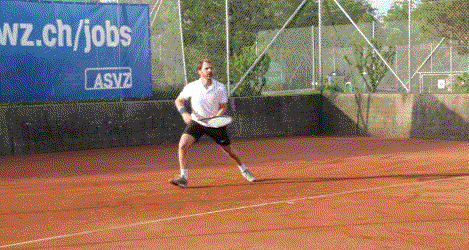

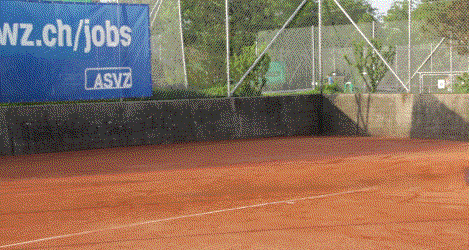

In [13]:
display(animated_gif(frames_folder, max_height=250, max_frames=500))
display(animated_gif(completed_frames, max_height=250, max_frames=500))

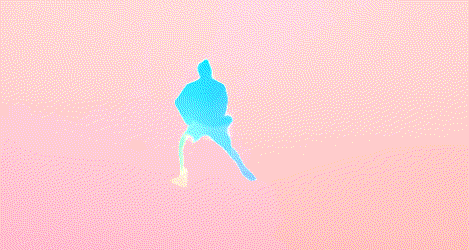

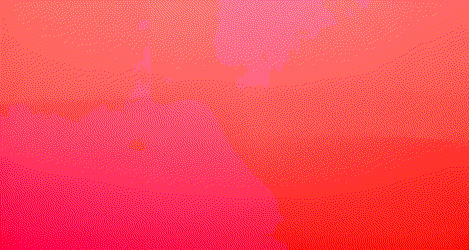

In [14]:
display(animated_gif(original_flow_forward, max_height=250, max_frames=500))
display(animated_gif(completed_flow_forward, max_height=250, max_frames=500))

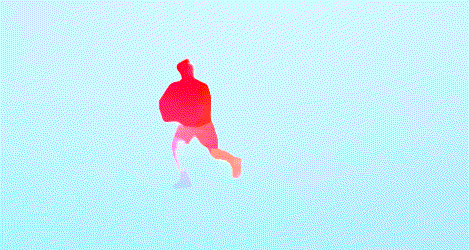

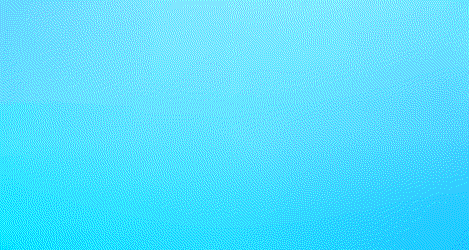

In [15]:
display(animated_gif(original_flow_backward, max_height=250, max_frames=500))
display(animated_gif(completed_flow_backward, max_height=250, max_frames=500))